# Initial Data Exploration

Data set used - [2023 Flight Fares](https://www.kaggle.com/datasets/yashdharme36/airfare-ml-predicting-flight-fares?resource=download) scraped from [EaseMyTrip](https://www.easemytrip.com/) from top 7 busiest airports in India.

## Limitations of the dataset
- Does not cover variations in aviation fuel prices
- Demand and supply for the particular flight seat is not available as this data is not publicly available on any flight booking web site.



In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from tqdm import tqdm_notebook
import warnings
warnings.filterwarnings('ignore')

In [3]:
data_path = "./../data\processed\cleaned_dataset_2023.csv"
data_frame = pd.read_csv(data_path)
data_frame.head()

,Date_of_journey,Journey_day,Airline,Flight_code,Class,Source,Departure,Total_stops,Arrival,Destination,Duration_in_hours,Days_left,Fare
0,16-01-2023,Monday,SpiceJet,SG-8169,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.0833,1,5335
1,16-01-2023,Monday,Indigo,6E-2519,Economy,Delhi,After 6 PM,non-stop,Before 6 AM,Mumbai,2.3333,1,5899
2,16-01-2023,Monday,GO FIRST,G8-354,Economy,Delhi,After 6 PM,non-stop,Before 6 AM,Mumbai,2.1667,1,5801
3,16-01-2023,Monday,SpiceJet,SG-8709,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.0833,1,5794
4,16-01-2023,Monday,Air India,AI-805,Economy,Delhi,After 6 PM,non-stop,After 6 PM,Mumbai,2.1667,1,5955


In [4]:
data_frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452088 entries, 0 to 452087
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Date_of_journey    452088 non-null  object 
 1   Journey_day        452088 non-null  object 
 2   Airline            452088 non-null  object 
 3   Flight_code        452088 non-null  object 
 4   Class              452088 non-null  object 
 5   Source             452088 non-null  object 
 6   Departure          452088 non-null  object 
 7   Total_stops        452088 non-null  object 
 8   Arrival            452088 non-null  object 
 9   Destination        452088 non-null  object 
 10  Duration_in_hours  452088 non-null  float64
 11  Days_left          452088 non-null  int64  
 12  Fare               452088 non-null  int64  
dtypes: float64(1), int64(2), object(10)
memory usage: 44.8+ MB


In [5]:
data_frame.describe()

,Duration_in_hours,Days_left,Fare
count,452088.000000,452088.000000,452088.000000
mean,12.349222,25.627902,22840.100890
std,7.431478,14.300846,20307.963002
min,0.750000,1.000000,1307.000000
25%,6.583300,13.000000,8762.750000
50%,11.333300,26.000000,13407.000000
75%,16.500000,38.000000,35587.000000
max,43.583300,50.000000,143019.000000


In [8]:
print("Rows and Coloumn count : ", data_frame.shape)

Rows and Coloumn count :  (452088, 13)


In [11]:
print("Dropping duplicate values...")
data_frame = data_frame.dropna()
data_frame.drop_duplicates(keep=False, inplace=True)
data_frame = data_frame.reset_index(drop = True)
print("Rows and Coloumn count : ", data_frame.shape)

Dropping duplicate values...
Rows and Coloumn count :  (440087, 13)


# Visualizing the Dataset

The insights that we gain through the process
- The most popular airline is Indigo
- The most common class is "Economy"

In [21]:
print("Count of Airlines : ")
temp_frame = data_frame.groupby(["Airline", "Flight_code"], as_index=False).count()
temp_frame["Airline"].value_counts()

Count of Airlines : 


Indigo         702
Air India      171
Vistara        165
AirAsia        106
GO FIRST       104
SpiceJet        92
AkasaAir        51
AllianceAir     10
StarAir          4
Name: Airline, dtype: int64

In [44]:
print("Values in Arrival : ")
temp_frame = data_frame.groupby(["Airline", "Arrival"], as_index=False).count()
temp_frame["Arrival"].value_counts()

Values in Arrival : 


12 PM - 6 PM    9
6 AM - 12 PM    9
After 6 PM      9
Before 6 AM     7
Name: Arrival, dtype: int64

In [45]:
print("Values in Total stops : ")
temp_frame = data_frame.groupby(["Airline", "Total_stops"], as_index=False).count()
temp_frame["Total_stops"].value_counts()

Values in Total stops : 


non-stop    9
1-stop      8
2+-stop     5
Name: Total_stops, dtype: int64

In [23]:
print("Count of Classes : ")
temp_frame = data_frame.groupby(["Airline", "Flight_code", "Class"], as_index=False).count()
temp_frame["Class"].value_counts()

Count of Classes : 


Economy            1401
Business            295
Premium Economy     137
First                 3
Name: Class, dtype: int64

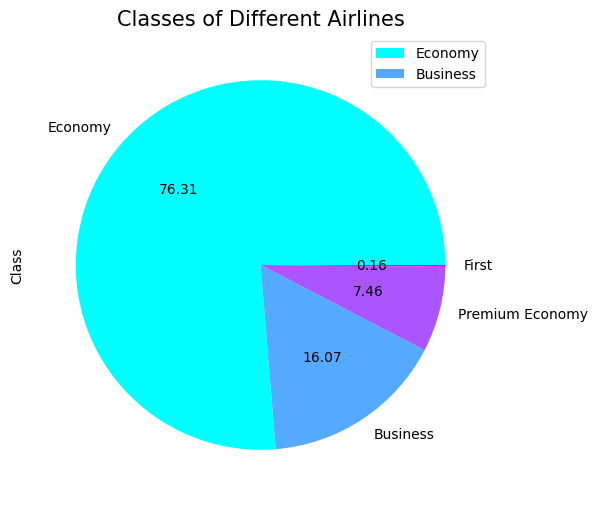

In [31]:
plt.figure(figsize=(8,6))
temp_frame['Class'].value_counts().plot(kind='pie',textprops={'color':'black'},autopct='%.2f',cmap='cool')
plt.title('Classes of Different Airlines',fontsize=15)
plt.legend(['Economy','Business'])
plt.show()

> **Prices and Airline relations**
- The maximum price range is provided by Vistara
- The most expensive fight would be Vistara and Air India
- The airlines that provide similar prices are SpiceJet, AirAsia, GoFirst and Indigo

In [32]:
fig = px.box(data_frame, y = "Fare", x = 'Airline', color_discrete_sequence = ["orange"], template = 'seaborn')
fig.show()

**Classes and their prices**
- Business class and First class tickets have the highest price range

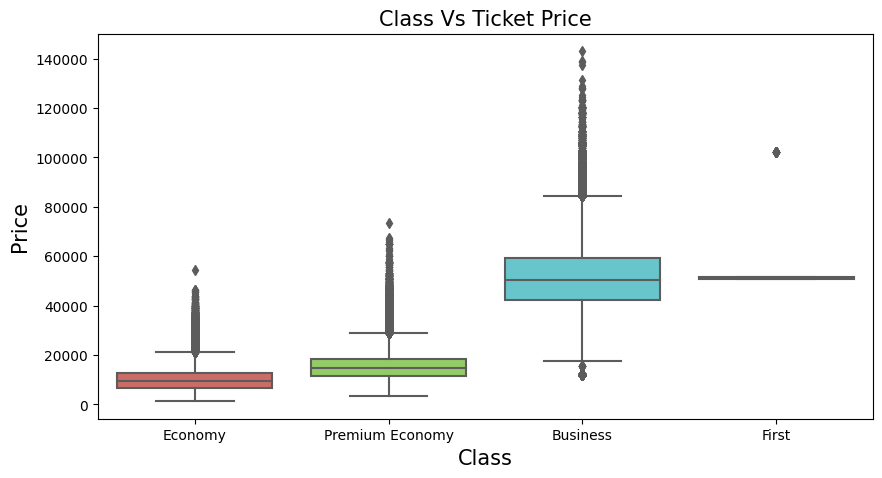

In [34]:
plt.figure(figsize=(10,5))
sns.boxplot(x='Class',y='Fare',data=data_frame,palette='hls')
plt.title('Class Vs Ticket Price',fontsize=15)
plt.xlabel('Class',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

**The relation between number of stops and the price**
- The flight that have a single stop have their prices largely distributed

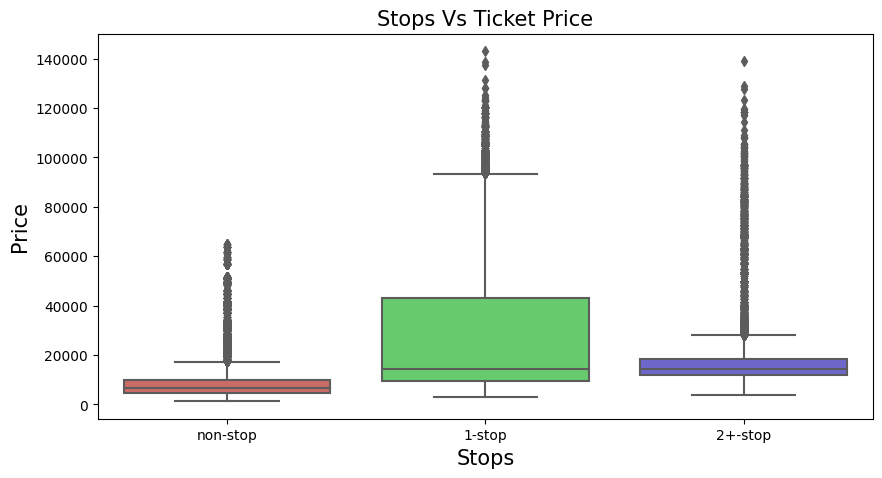

In [35]:
plt.figure(figsize=(10,5))
sns.boxplot(x='Total_stops',y='Fare',data=data_frame,palette='hls')
plt.title('Stops Vs Ticket Price',fontsize=15)
plt.xlabel('Stops',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

**The relation between price, departure and arrival times**

Departure time vs Ticket price
- Price is high at night time
- Price is almost equal during early morning, morning and evening
- Price is low for late night flights

Arrival time vs Ticket price
- Price is high in evening
- Price is almost equal during morning and night
- Price is low for lat night flights

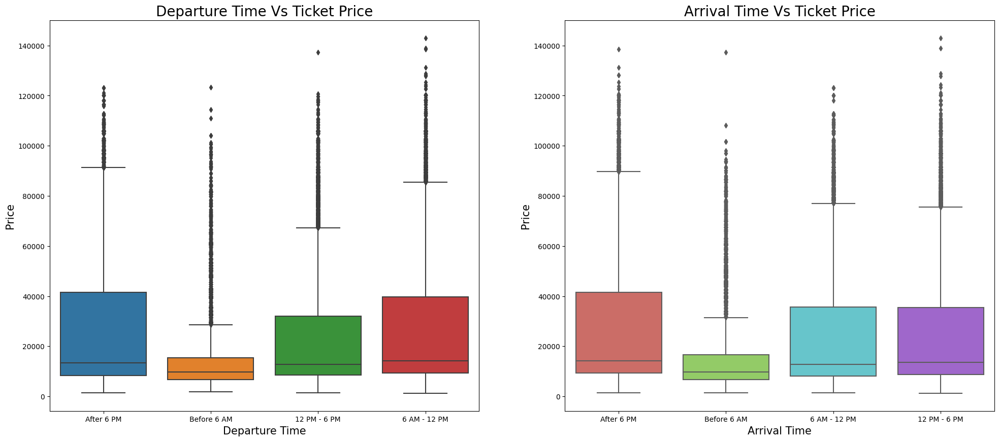

In [37]:
plt.figure(figsize=(24,10))
plt.subplot(1,2,1)
sns.boxplot(x='Departure',y='Fare',data=data_frame)
plt.title('Departure Time Vs Ticket Price',fontsize=20)
plt.xlabel('Departure Time',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.subplot(1,2,2)
sns.boxplot(x='Arrival',y='Fare',data=data_frame,palette='hls')
plt.title('Arrival Time Vs Ticket Price',fontsize=20)
plt.xlabel('Arrival Time',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

**How the price varies with respect to time for different classes**
- In economy and business class thr price increases with time

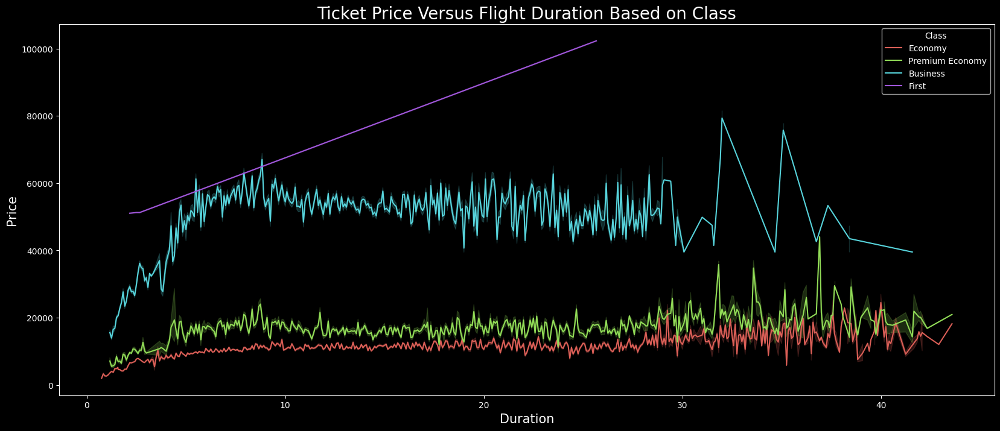

In [38]:
plt.style.use('dark_background')
plt.figure(figsize=(20,8))
sns.lineplot(data = data_frame,x = 'Duration_in_hours',y = 'Fare',hue = 'Class',palette = 'hls')
plt.title('Ticket Price Versus Flight Duration Based on Class',fontsize = 20)
plt.xlabel('Duration',fontsize = 15)
plt.ylabel('Price',fontsize = 15)
plt.show()

**How does the price affect the days of departure ?**
- the ticket prices are highest when there are two days left for departure

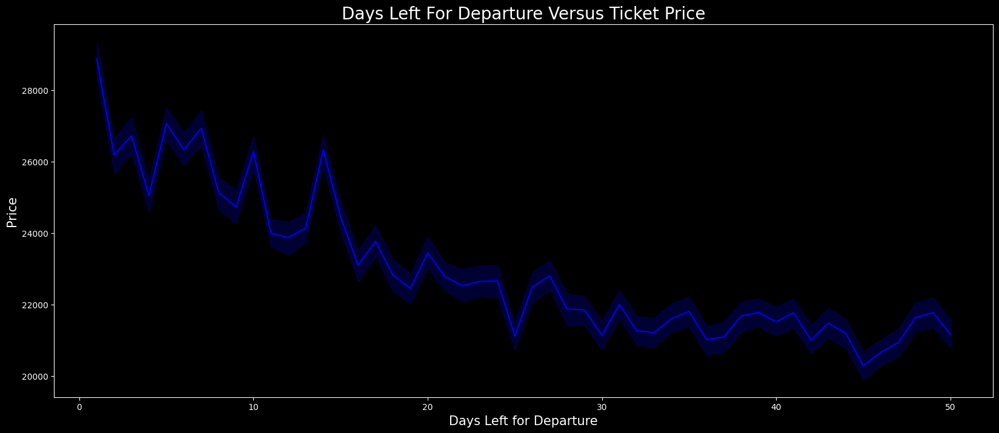

In [39]:
plt.figure(figsize=(20,8))
sns.lineplot(data=data_frame,x='Days_left',y='Fare',color='blue')
plt.title('Days Left For Departure Versus Ticket Price',fontsize=20)
plt.xlabel('Days Left for Departure',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

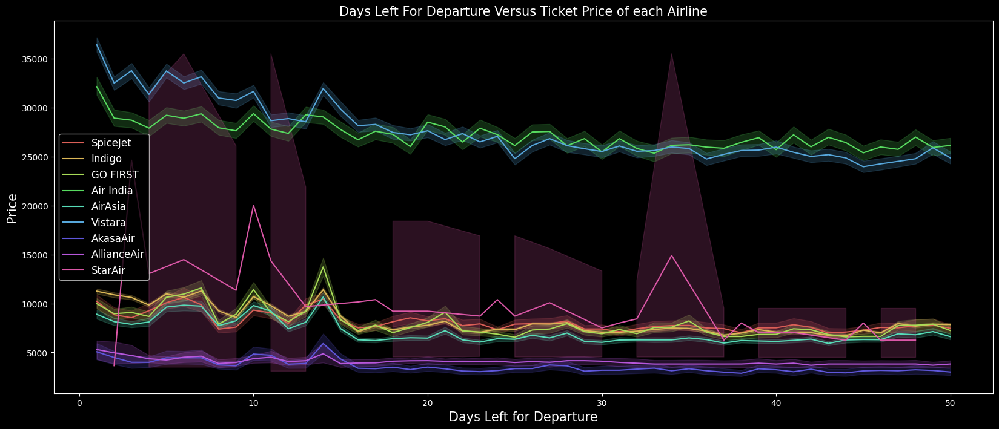

In [41]:
plt.figure(figsize=(20,8))
sns.lineplot(data=data_frame,x='Days_left',y='Fare',color='blue',hue='Airline',palette='hls')
plt.title('Days Left For Departure Versus Ticket Price of each Airline',fontsize=15)
plt.legend(fontsize=12)
plt.xlabel('Days Left for Departure',fontsize=15)
plt.ylabel('Price',fontsize=15)
plt.show()

**Total number of Flights from one city to another**

In [42]:
data_frame.groupby(['Airline','Source','Destination'],as_index=False)['Fare'].mean().head(10)

,Airline,Source,Destination,Fare
0,Air India,Ahmedabad,Bangalore,30898.056017
1,Air India,Ahmedabad,Chennai,31986.554209
2,Air India,Ahmedabad,Delhi,25284.740260
3,Air India,Ahmedabad,Hyderabad,28618.727551
4,Air India,Ahmedabad,Kolkata,30114.170294
5,Air India,Ahmedabad,Mumbai,31228.560304
6,Air India,Bangalore,Ahmedabad,28063.483264
7,Air India,Bangalore,Chennai,28978.088460
8,Air India,Bangalore,Delhi,23134.751645
9,Air India,Bangalore,Hyderabad,27742.954733


**Average Price of different Airlines from Source city to Destination city**

In [43]:
data_frame.groupby(['Airline','Source','Destination'],as_index=False)['Fare'].mean().head(10)

,Airline,Source,Destination,Fare
0,Air India,Ahmedabad,Bangalore,30898.056017
1,Air India,Ahmedabad,Chennai,31986.554209
2,Air India,Ahmedabad,Delhi,25284.740260
3,Air India,Ahmedabad,Hyderabad,28618.727551
4,Air India,Ahmedabad,Kolkata,30114.170294
5,Air India,Ahmedabad,Mumbai,31228.560304
6,Air India,Bangalore,Ahmedabad,28063.483264
7,Air India,Bangalore,Chennai,28978.088460
8,Air India,Bangalore,Delhi,23134.751645
9,Air India,Bangalore,Hyderabad,27742.954733
